# Import Libraries

In [114]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
from skimage.morphology import octagon
from skimage.feature import corner_harris, corner_peaks, corner_orientations, corner_subpix
from skimage.transform import AffineTransform

# Display of the two images

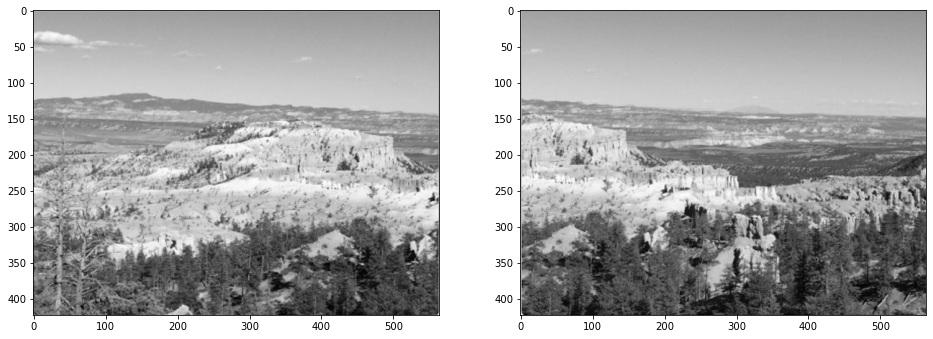

In [115]:
figure, ax = plt.subplots(1, 2, figsize=(16, 10))

le_image = cv2.imread('leftImage.png')
le_image_gr = cv2.cvtColor(le_image, cv2.COLOR_BGR2GRAY)
ax[0].imshow(le_image_gr, cmap = "gray")

ri_image = cv2.imread('rightImage.png')
ri_image_gr = cv2.cvtColor(ri_image, cv2.COLOR_BGR2GRAY)
ax[1].imshow(ri_image_gr, cmap = "gray")

# Harris corners 

Performing sesitivity analysis for both imagees
We are testing for min_distance 10,20 and threshold_rel 0.001,0.01


min_distance 10 and threshhold_rel 0.001

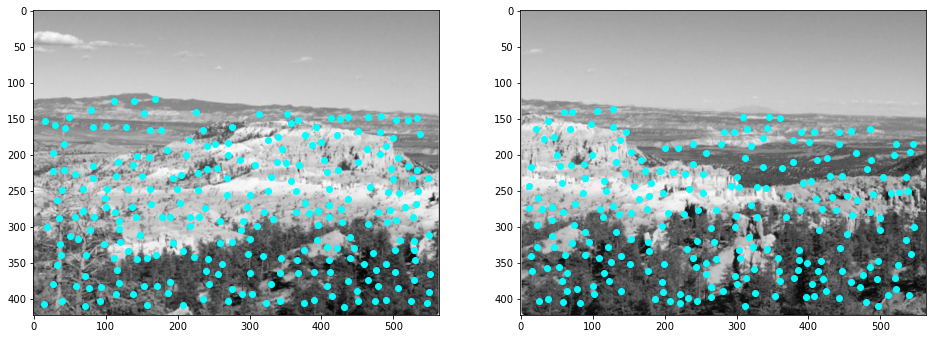

In [116]:
coords = corner_peaks(corner_harris(le_image_gr), min_distance=10, threshold_rel=0.001)
coords_subpix = corner_subpix(le_image_gr, coords, window_size=13)

figure, ax = plt.subplots(1, 2, figsize=(16, 10))

ax[0].imshow(le_image_gr, cmap=plt.cm.gray)
ax[0].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)

coords = corner_peaks(corner_harris(ri_image_gr), min_distance=10, threshold_rel=0.001)
coords_subpix = corner_subpix(ri_image_gr, coords, window_size=13)

ax[1].imshow(ri_image_gr, cmap=plt.cm.gray)
ax[1].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)
plt.show()

min_distance 10 and threshhold_rel 0.01

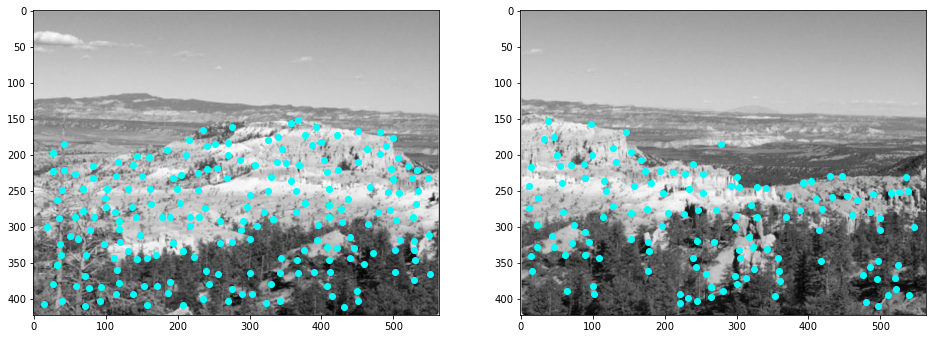

In [117]:
coords = corner_peaks(corner_harris(le_image_gr), min_distance=10, threshold_rel=0.01)
coords_subpix = corner_subpix(le_image_gr, coords, window_size=13)

figure, ax = plt.subplots(1, 2, figsize=(16, 10))

ax[0].imshow(le_image_gr, cmap=plt.cm.gray)
ax[0].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)

coords = corner_peaks(corner_harris(ri_image_gr), min_distance=10, threshold_rel=0.01)
coords_subpix = corner_subpix(ri_image_gr, coords, window_size=13)

ax[1].imshow(ri_image_gr, cmap=plt.cm.gray)
ax[1].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)
plt.show()

min_distance 20 and threshhold_rel 0.001

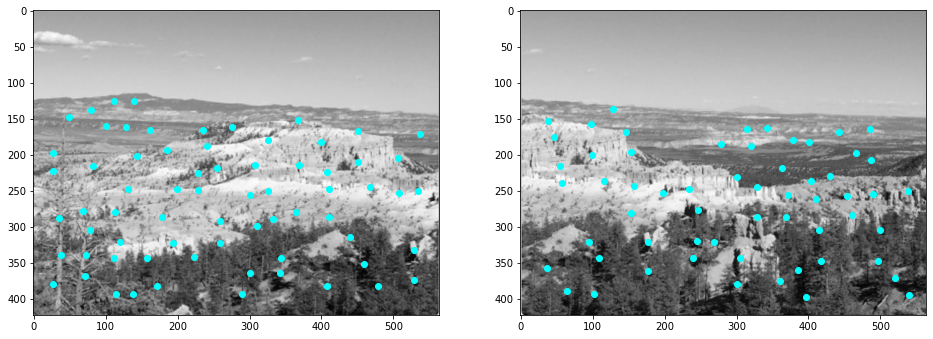

In [118]:
coords = corner_peaks(corner_harris(le_image_gr), min_distance=20, threshold_rel=0.001)
coords_subpix = corner_subpix(le_image_gr, coords, window_size=13)

figure, ax = plt.subplots(1, 2, figsize=(16, 10))

ax[0].imshow(le_image_gr, cmap=plt.cm.gray)
ax[0].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)

coords = corner_peaks(corner_harris(ri_image_gr), min_distance=20, threshold_rel=0.001)
coords_subpix = corner_subpix(ri_image_gr, coords, window_size=13)

ax[1].imshow(ri_image_gr, cmap=plt.cm.gray)
ax[1].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)
plt.show()

min_distance 20 and threshhold_rel 0.01

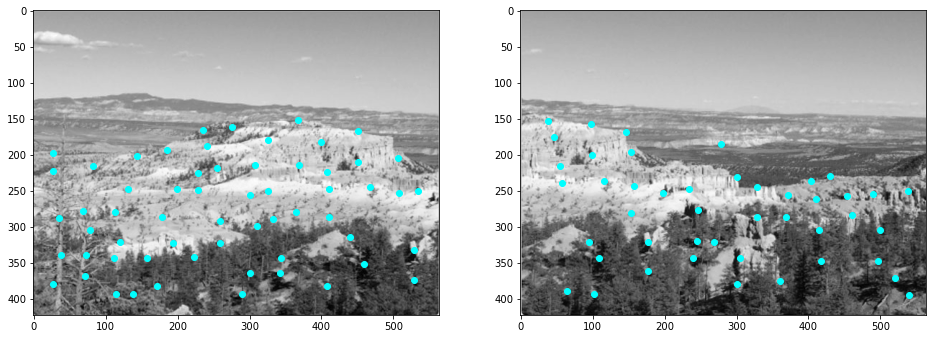

In [119]:
coords = corner_peaks(corner_harris(le_image_gr), min_distance=20, threshold_rel=0.01)
coords_subpix = corner_subpix(le_image_gr, coords, window_size=13)

figure, ax = plt.subplots(1, 2, figsize=(16, 10))

ax[0].imshow(le_image_gr, cmap=plt.cm.gray)
ax[0].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)

coords = corner_peaks(corner_harris(ri_image_gr), min_distance=20, threshold_rel=0.01)
coords_subpix = corner_subpix(ri_image_gr, coords, window_size=13)

ax[1].imshow(ri_image_gr, cmap=plt.cm.gray)
ax[1].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)
plt.show()

As we notice, the best combination is with distance=10 and theshold_rel=0.001.
In this way, we avoid getting too many outliers

In [120]:
def plot_harris(axis, img, min_distance, threshold_rel):
    # Find Harris corners
    coords = corner_peaks(corner_harris(img), min_distance=min_distance, threshold_rel=threshold_rel)
    
    # Find corner orientation
    orient = corner_orientations(img, coords, octagon(3, 2))
    orient = np.rad2deg(orient)
    
    final_coords = []
    for crd, ori in zip(coords,orient):
        crd = list(crd)
        crd.append(ori)
        final_coords.append(crd)
        
    
    axis.imshow(img, cmap=plt.cm.gray)
    axis.plot(coords[:, 1], coords[:, 0], color='cyan', marker='x', linestyle='None', markersize=6)
    axis.title.set_text('Min_Dist: '+str(min_distance)+', Threshold_Rel: '+str(threshold_rel))
    return final_coords

Corners detected on the left image:  249
Corners detected on the right image:  234


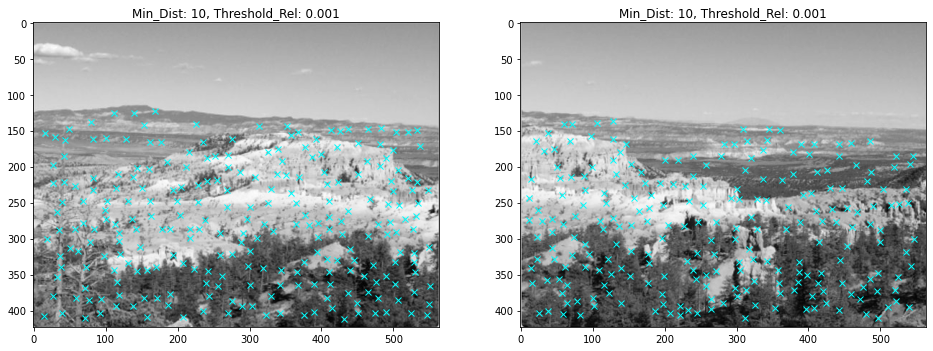

In [121]:
#For this combination
fig, ((ax1),(ax2)) = plt.subplots(1, 2, figsize=(16,10))

# Best combination after experiments
min_dist = 10
thresh = 0.001

# Compute the Harris Corners coordinates
harris_keypoints_l = plot_harris(ax1, le_image_gr, min_dist, thresh)
harris_keypoints_r = plot_harris(ax2, ri_image_gr, min_dist, thresh)

print("Corners detected on the left image: ",len(harris_keypoints_l))
print("Corners detected on the right image: ",len(harris_keypoints_r))

## We compute the SIFT descriptors of the resulted key-points from Harris corner detector.

In [122]:
patch_size = 15

# Transform the coordinates from Harris Corners function to Keypoint instances, so that we can use them with the SIFT function.
# Extract a patch around each of our detected corners' coordinates

kp_l = [cv2.KeyPoint(float(crd[1]), float(crd[0]), patch_size, angle = int(crd[2])) for crd in harris_keypoints_l]
kp_r = [cv2.KeyPoint(float(crd[1]), float(crd[0]), patch_size, angle = int(crd[2])) for crd in harris_keypoints_r]

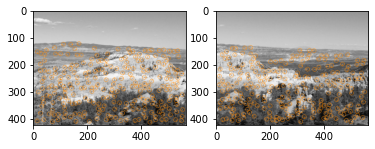

In [123]:
fig, ((ax1),(ax2)) = plt.subplots(1, 2)

sift_l = cv2.drawKeypoints(le_image_gr,kp_l,le_image,color=(255, 136, 0),flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
sift_r = cv2.drawKeypoints(ri_image_gr,kp_r,ri_image,color=(255, 136, 0),flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

ax1.imshow(sift_l,cmap=plt.cm.gray)
ax2.imshow(sift_r,cmap=plt.cm.gray)

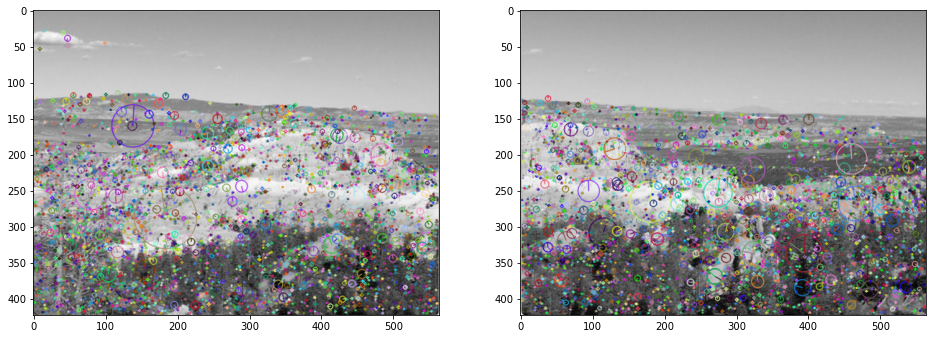

In [124]:
figure, ax = plt.subplots(1, 2, figsize=(16, 10))

sift = cv2.SIFT_create()

kp_l, ds_l = sift.detectAndCompute(le_image_gr,None)
img = cv2.drawKeypoints(le_image_gr,kp_l,le_image, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
ax[0].imshow(img, cmap = "gray")


kp_r, ds_r  = sift.detectAndCompute(ri_image_gr,None)
img = cv2.drawKeypoints(ri_image_gr,kp_r,ri_image,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
ax[1].imshow(img, cmap = "gray")

In [125]:
iterations = len(ds_l) * len(ds_r)
print("Number of iterations: ",iterations)

Number of iterations:  11217135


In [126]:
ratio = iterations/30000
if ratio>1:
    print("We will sample a part of the corners.")

kp1_l, kp1_r, ds1_l, ds1_r = zip(*random.sample(list(zip(kp_l, kp_r, ds_l, ds_r)), int(min(len(ds_r),len(ds_l))/(ratio/15))))

We will sample a part of the corners.


In [127]:
iterations = len(ds1_l) * len(ds1_r)
print("Number of iterations: ",iterations)

Number of iterations:  16384


## Euclidian distance

In [128]:
def euclidian_distance(sift1,sift2):
    index_pairs = []
    eucl_dist = []
    ci=0
    for i in sift1:
        cj=0
        for j in sift2:
            index_pairs.append([ci,cj])
            norm_i = i / np.sqrt(np.sum(i**2))
            norm_j = j / np.sqrt(np.sum(j**2))
            eucl_dist.append(np.sqrt(sum((e1-e2)**2 for e1, e2 in zip(norm_i,norm_j))))
            cj=cj+1
        ci=ci+1
    return index_pairs, eucl_dist
            
index_pairs, eucl_dist = euclidian_distance(ds1_l,ds1_r)

In [129]:
index_pairs = np.array(index_pairs)
eucl_dist = np.array(eucl_dist)
inds = eucl_dist.argsort()

# sorted_eucl_dist = np.flip(eucl_dist[inds])
# sorted_index_pairs = np.flip(index_pairs[inds])

sorted_eucl_dist = eucl_dist[inds]
sorted_index_pairs = index_pairs[inds]

# Results with the corresponding indices
print("Sorted euclidian distances (we show the 3 lowest):")
print(sorted_eucl_dist[:3])
print("\nSorted corner pairs based on their descriptor distances (we show the 3 best matches)")
print(sorted_index_pairs[:3])

Sorted euclidian distances (we show the 3 lowest):
[0.5376753  0.55388071 0.57543124]

Sorted corner pairs based on their descriptor distances (we show the 3 best matches)
[[ 68 124]
 [ 41  80]
 [ 59   0]]


## RANSAC

Point matching and image stritching

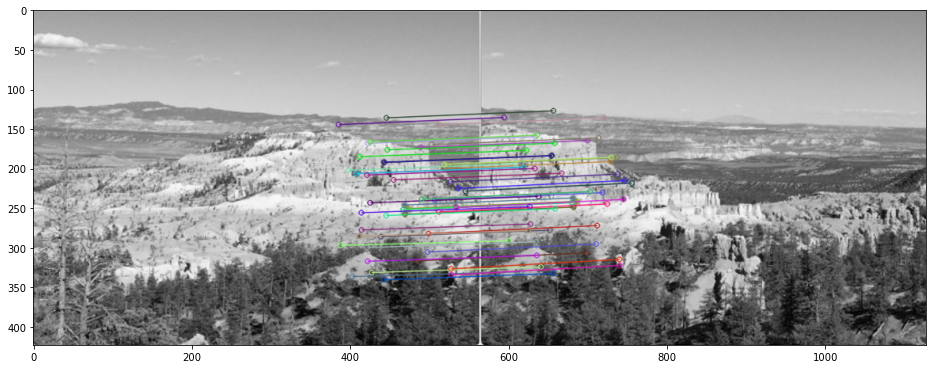

In [130]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

le_image = cv2.imread('leftImage.png')
le_image_gr = cv2.cvtColor(le_image, cv2.COLOR_BGR2GRAY)

ri_image = cv2.imread('rightImage.png')
ri_image_gr = cv2.cvtColor(ri_image, cv2.COLOR_BGR2GRAY)

matches = bf.match(ds_l,ds_r)
matches = sorted(matches, key = lambda x:x.distance)

stitched = cv2.drawMatches(le_image_gr, kp_l, ri_image_gr, kp_r, 
                           matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize = (16,8))
plt.imshow(stitched, cmap='gray')

## Homography

In [131]:
kpsA = np.float32([kp.pt for kp in kp_l])
kpsB = np.float32([kp.pt for kp in kp_r])
H = None
if len(matches) > 4:
    ptsB = np.float32([kpsA[m.queryIdx] for m in matches])
    ptsA = np.float32([kpsB[m.trainIdx] for m in matches])
        
    # estimate the homography between the sets of points
    (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,4) #threshold
print(H)

[[ 8.39237251e-01 -1.61569305e-02  3.58255587e+02]
 [-4.78444077e-02  9.69676077e-01  1.33724793e+01]
 [-2.85270130e-04 -1.00844044e-06  1.00000000e+00]]


## Wrap Image 1 onto image 2

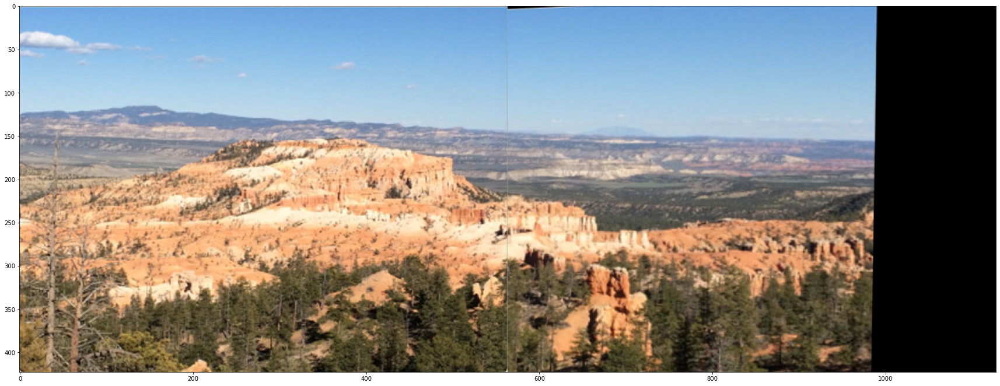

In [132]:
new = cv2.warpPerspective(ri_image, H, (ri_image.shape[1] + le_image.shape[1], ri_image.shape[0]))
new[0:le_image.shape[0], 0:le_image.shape[1]] = le_image
new = cv2.cvtColor(new, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30, 20))
plt.imshow(new)

## We are doing the same procedure for another image

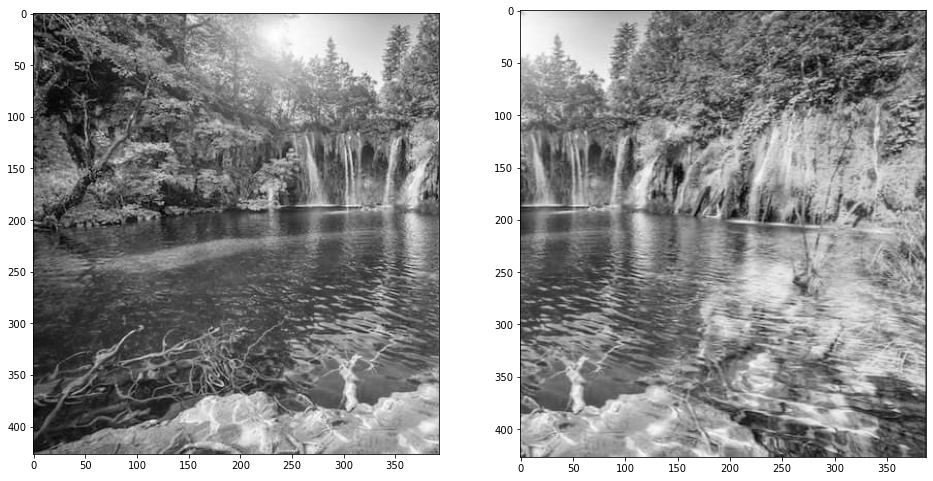

In [133]:
figure, ax = plt.subplots(1, 2, figsize=(16, 10))

le_image = cv2.imread('4.jpg')
le_image_gr = cv2.cvtColor(le_image, cv2.COLOR_BGR2GRAY)
ax[0].imshow(le_image_gr, cmap = "gray")

ri_image = cv2.imread('3.jpg')
ri_image_gr = cv2.cvtColor(ri_image, cv2.COLOR_BGR2GRAY)
ax[1].imshow(ri_image_gr, cmap = "gray")

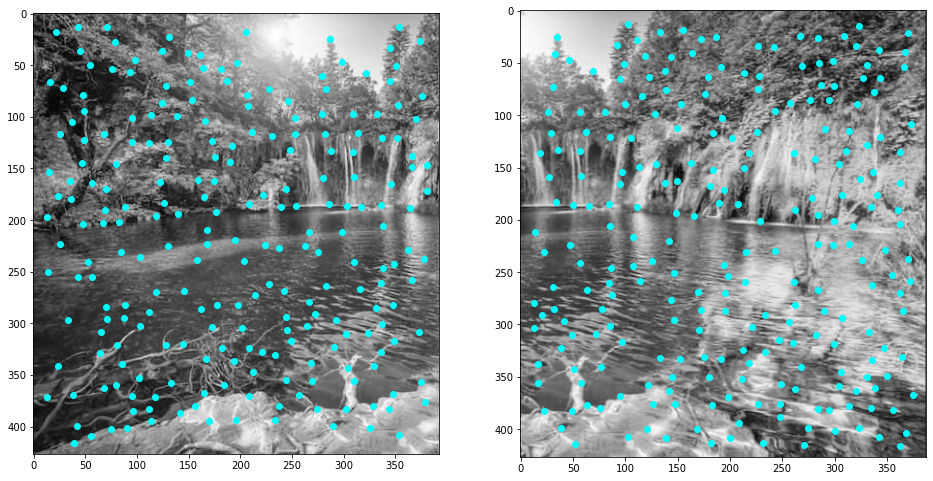

In [134]:
#mind_dinstance=10 and threshhold=0.001
coords = corner_peaks(corner_harris(le_image_gr), min_distance=10, threshold_rel=0.001)
coords_subpix = corner_subpix(le_image_gr, coords, window_size=13)

figure, ax = plt.subplots(1, 2, figsize=(16, 10))

ax[0].imshow(le_image_gr, cmap=plt.cm.gray)
ax[0].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)

coords = corner_peaks(corner_harris(ri_image_gr), min_distance=10, threshold_rel=0.001)
coords_subpix = corner_subpix(ri_image_gr, coords, window_size=13)

ax[1].imshow(ri_image_gr, cmap=plt.cm.gray)
ax[1].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)
plt.show()

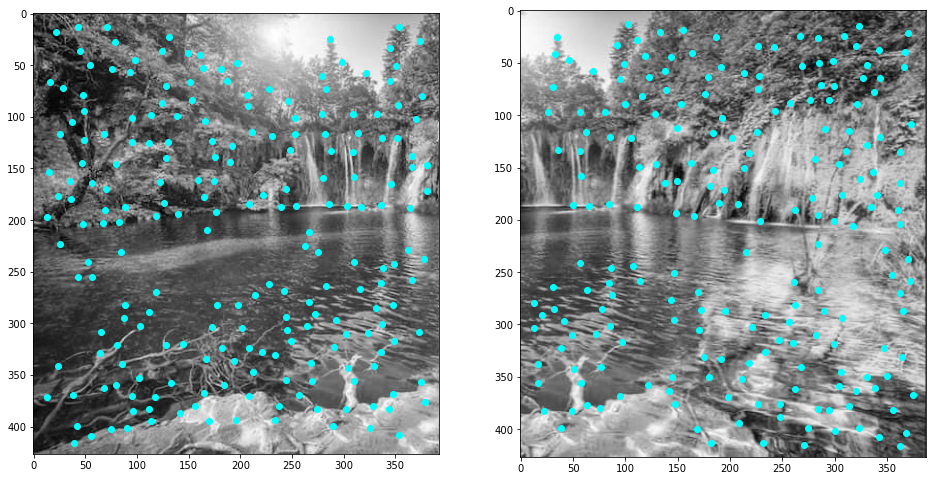

In [135]:
#mind_dinstance=10 and threshhold=0.01
coords = corner_peaks(corner_harris(le_image_gr), min_distance=10, threshold_rel=0.01)
coords_subpix = corner_subpix(le_image_gr, coords, window_size=13)

figure, ax = plt.subplots(1, 2, figsize=(16, 10))

ax[0].imshow(le_image_gr, cmap=plt.cm.gray)
ax[0].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)

coords = corner_peaks(corner_harris(ri_image_gr), min_distance=10, threshold_rel=0.01)
coords_subpix = corner_subpix(ri_image_gr, coords, window_size=13)

ax[1].imshow(ri_image_gr, cmap=plt.cm.gray)
ax[1].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)
plt.show()

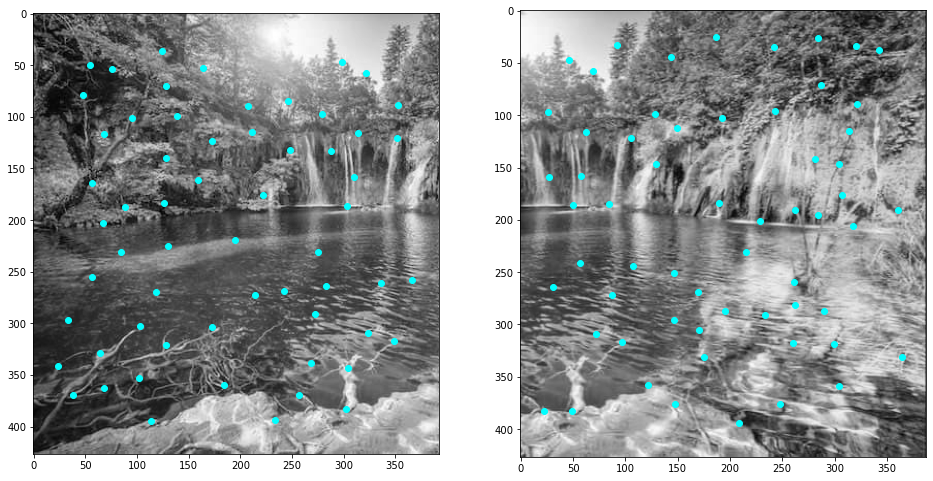

In [136]:
#mind_dinstance=20 and threshhold=0.001
coords = corner_peaks(corner_harris(le_image_gr), min_distance=20, threshold_rel=0.001)
coords_subpix = corner_subpix(le_image_gr, coords, window_size=13)

figure, ax = plt.subplots(1, 2, figsize=(16, 10))

ax[0].imshow(le_image_gr, cmap=plt.cm.gray)
ax[0].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)

coords = corner_peaks(corner_harris(ri_image_gr), min_distance=20, threshold_rel=0.001)
coords_subpix = corner_subpix(ri_image_gr, coords, window_size=13)

ax[1].imshow(ri_image_gr, cmap=plt.cm.gray)
ax[1].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)
plt.show()

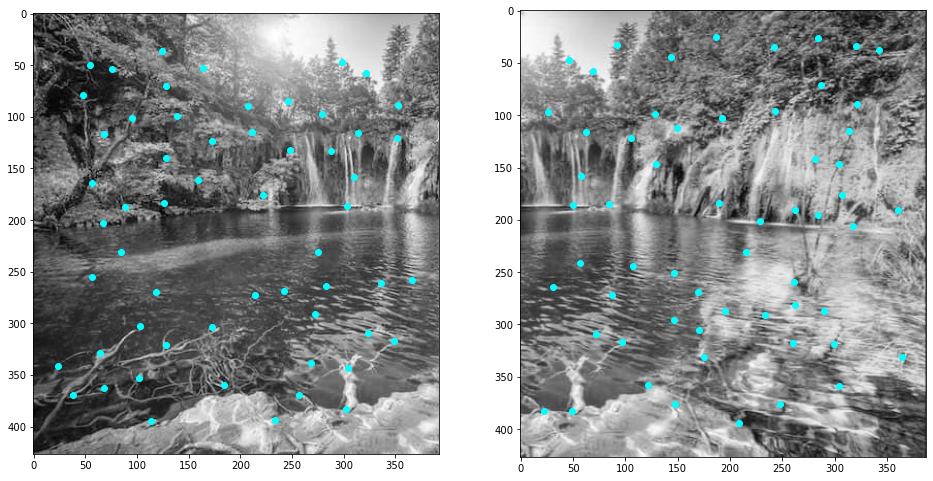

In [137]:
#mind_dinstance=20 and threshhold=0.01
coords = corner_peaks(corner_harris(le_image_gr), min_distance=20, threshold_rel=0.01)
coords_subpix = corner_subpix(le_image_gr, coords, window_size=13)

figure, ax = plt.subplots(1, 2, figsize=(16, 10))

ax[0].imshow(le_image_gr, cmap=plt.cm.gray)
ax[0].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)

coords = corner_peaks(corner_harris(ri_image_gr), min_distance=20, threshold_rel=0.01)
coords_subpix = corner_subpix(ri_image_gr, coords, window_size=13)

ax[1].imshow(ri_image_gr, cmap=plt.cm.gray)
ax[1].plot(coords[:, 1], coords[:, 0], color='cyan', marker='o',linestyle='None', markersize=6)
plt.show()

In [138]:
def plot_harris(axis, img, min_distance, threshold_rel):
    # Find Harris corners
    coords = corner_peaks(corner_harris(img), min_distance=min_distance, threshold_rel=threshold_rel)
    
    # Find corner orientation
    orient = corner_orientations(img, coords, octagon(3, 2))
    orient = np.rad2deg(orient)
    
    final_coords = []
    for crd, ori in zip(coords,orient):
        crd = list(crd)
        crd.append(ori)
        final_coords.append(crd)
        
    
    axis.imshow(img, cmap=plt.cm.gray)
    axis.plot(coords[:, 1], coords[:, 0], color='cyan', marker='x', linestyle='None', markersize=6)
    axis.title.set_text('Min_Dist: '+str(min_distance)+', Threshold_Rel: '+str(threshold_rel))
    return final_coords

Best combination is min_distance=10 and threshold_rel=0.001

Corners detected on the left image:  230
Corners detected on the right image:  244


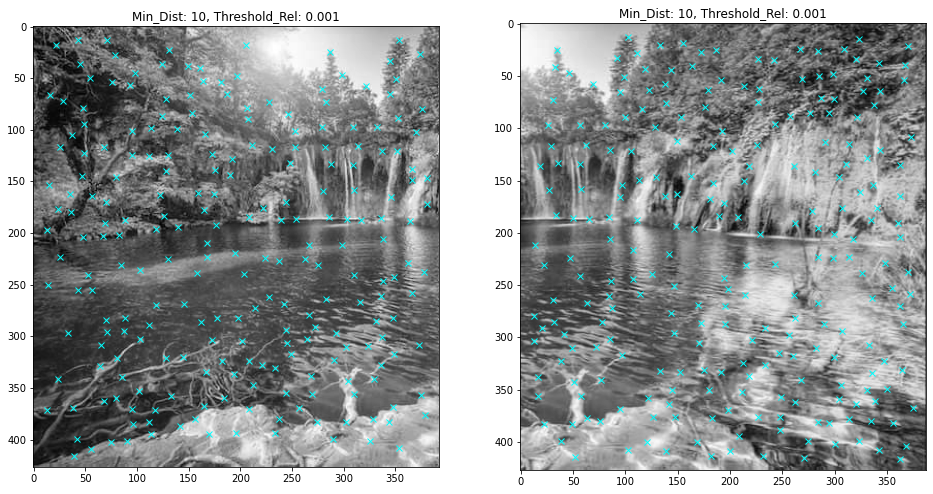

In [139]:
#For this combination
fig, ((ax1),(ax2)) = plt.subplots(1, 2, figsize=(16,10))

# Best combination after experiments
min_dist = 10
thresh = 0.001

# Compute the Harris Corners coordinates
harris_keypoints_l = plot_harris(ax1, le_image_gr, min_dist, thresh)
harris_keypoints_r = plot_harris(ax2, ri_image_gr, min_dist, thresh)

print("Corners detected on the left image: ",len(harris_keypoints_l))
print("Corners detected on the right image: ",len(harris_keypoints_r))

## We compute the SIFT descriptors of the resulted key-points from Harris corner detector.

In [140]:
patch_size = 15

# Transform the coordinates from Harris Corners function to Keypoint instances, so that we can use them with the SIFT function.
# Extract a patch around each of our detected corners' coordinates

kp_l = [cv2.KeyPoint(float(crd[1]), float(crd[0]), patch_size, angle = int(crd[2])) for crd in harris_keypoints_l]
kp_r = [cv2.KeyPoint(float(crd[1]), float(crd[0]), patch_size, angle = int(crd[2])) for crd in harris_keypoints_r]

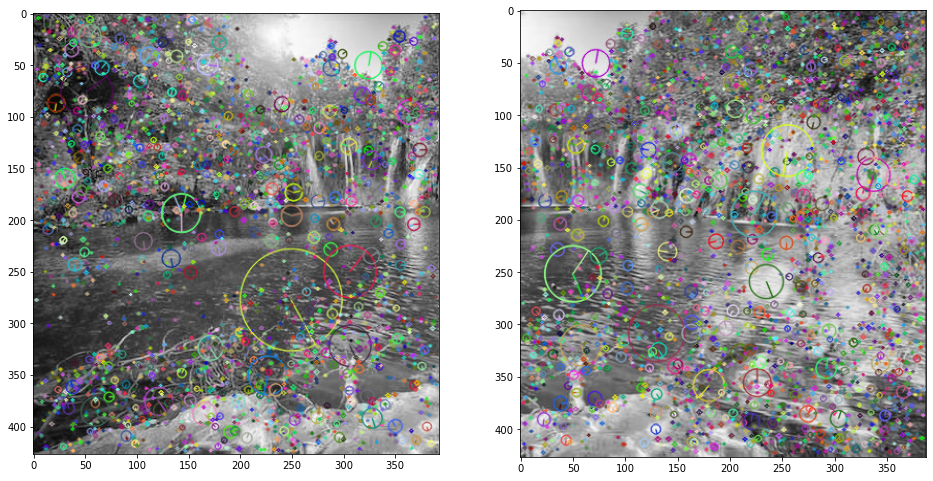

In [141]:
figure, ax = plt.subplots(1, 2, figsize=(16, 10))

sift = cv2.SIFT_create()

kp_l, ds_l = sift.detectAndCompute(le_image_gr,None)
img = cv2.drawKeypoints(le_image_gr,kp_l,le_image, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
ax[0].imshow(img, cmap = "gray")


kp_r, ds_r  = sift.detectAndCompute(ri_image_gr,None)
img = cv2.drawKeypoints(ri_image_gr,kp_r,ri_image,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
ax[1].imshow(img, cmap = "gray")

## Ransac

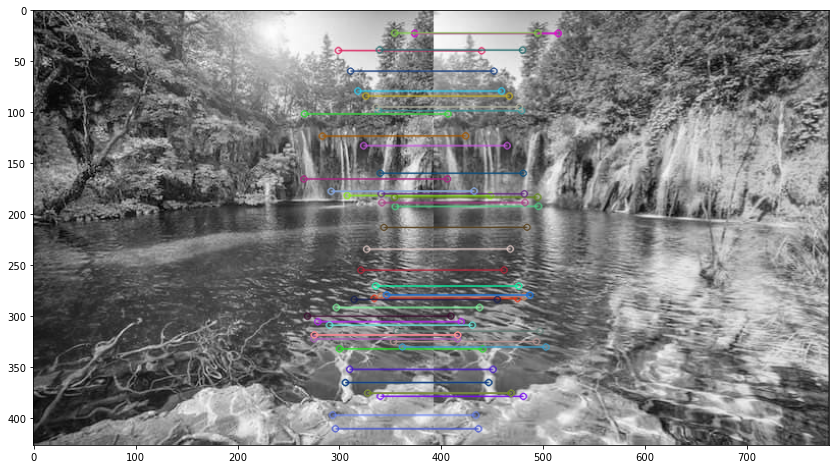

In [142]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

le_image = cv2.imread('4.jpg')
le_image_gr = cv2.cvtColor(le_image, cv2.COLOR_BGR2GRAY)

ri_image = cv2.imread('3.jpg')
ri_image_gr = cv2.cvtColor(ri_image, cv2.COLOR_BGR2GRAY)

matches = bf.match(ds_l,ds_r)
matches = sorted(matches, key = lambda x:x.distance)

stitched = cv2.drawMatches(le_image_gr, kp_l, ri_image_gr, kp_r, 
                           matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize = (16,8))
plt.imshow(stitched, cmap='gray')

## Homography

In [143]:
kpsA = np.float32([kp.pt for kp in kp_l])
kpsB = np.float32([kp.pt for kp in kp_r])
H = None
if len(matches) > 4:
    ptsB = np.float32([kpsA[m.queryIdx] for m in matches])
    ptsA = np.float32([kpsB[m.trainIdx] for m in matches])
        
    # estimate the homography between the sets of points
    (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,4) #threshold
print(H)

[[ 1.00032630e+00  2.83073306e-04  2.52427022e+02]
 [-3.34161582e-04  1.00060115e+00  4.93529755e-03]
 [ 8.03447984e-07  1.30159268e-06  1.00000000e+00]]


## Wrap image into image 2

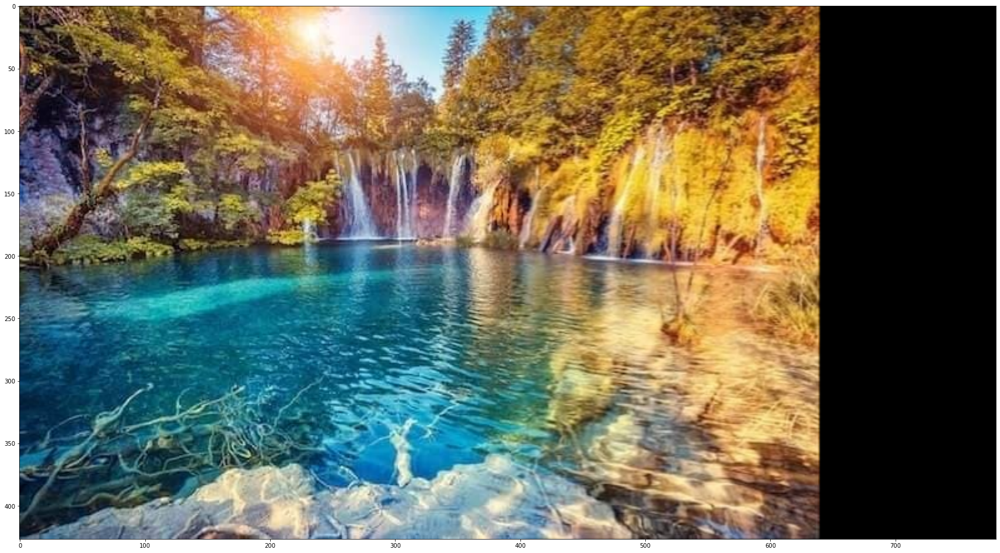

In [144]:
new = cv2.warpPerspective(ri_image, H, (ri_image.shape[1] + le_image.shape[1], ri_image.shape[0]))
new[0:le_image.shape[0], 0:le_image.shape[1]] = le_image
new = cv2.cvtColor(new, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30, 20))
plt.imshow(new)